# Drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive/')
root_dir = "/content/gdrive/My Drive/"

Mounted at /content/gdrive/


# Libs

In [ ]:
!pip install deep-translator

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.3/42.3 kB 1.4 MB/s eta 0:00:00


In [ ]:
!pip install salesforce-lavis

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 9.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.6/13.6 MB 36.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.4/235.4 kB 30.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 5.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.8/47.8 MB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.7/203.7 kB 23.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━

In [ ]:
import pandas as pd
import numpy as np
from PIL import Image
import requests
from tqdm import tqdm
import torch
import torch.nn.functional as F
from pkg_resources import packaging
from glob import glob
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import seaborn as sns
sns.set_theme("notebook", font_scale=1.3)
import os
import json
from deep_translator import GoogleTranslator
from scipy import spatial

from torchvision import transforms
from torchvision.transforms.functional import InterpolationMode
import numpy as np, matplotlib, matplotlib.pyplot as plt, seaborn as sns

# Unzip folder

In [ ]:
!unzip /content/pietanze.zip

Archive:  /content/pietanze.zip
   creating: pietanze/
  inflating: pietanze/mappa.json     
  inflating: pietanze/.DS_Store      
   creating: pietanze/dolce/
  inflating: pietanze/dolce/bigne_1.jpg  
  inflating: pietanze/dolce/.DS_Store  
  inflating: pietanze/dolce/tiramisu_2.jpeg  
  inflating: pietanze/dolce/bigne_2.jpg  
  inflating: pietanze/dolce/bigne_3.jpg  
  inflating: pietanze/dolce/baba_1.jpeg  
  inflating: pietanze/dolce/crostata_1.jpg  
  inflating: pietanze/dolce/crostata_3.jpg  
  inflating: pietanze/dolce/crostata_2.jpg  
  inflating: pietanze/dolce/baba_2.jpg  
  inflating: pietanze/dolce/baba_3.jpg  
  inflating: pietanze/dolce/panna_cotta_1.jpeg  
  inflating: pietanze/dolce/panna_cotta_2.jpg  
  inflating: pietanze/dolce/panna_cotta_3.jpg  
  inflating: pietanze/dolce/tiramisu_1.jpg  
  inflating: pietanze/dolce/tiramisu_3.jpg  
  inflating: pietanze/dolce/millefoglie_1.jpg  
  inflating: pietanze/dolce/millefoglie_2.jpg  
  inflating: pietanze/dolce/millefogli

In [ ]:
import json
image_map = None
with open('/content/pietanze/mappa.json', 'r') as f:
    image_map = json.load(f)

# Functions

In [ ]:
# setting device on GPU if available, else CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)
print()

#Additional Info when using cuda
if device.type == 'cuda':
    print(torch.cuda.get_device_name(0))

Using device: cuda

Tesla T4


In [ ]:
def translate_caption(string):
    try:
        #print('ita_string: ', string)
        string_translated = GoogleTranslator(source='auto', target='en').translate(string)
        #print('string_translated: ', string_translated)
        return string_translated
    except Exception as e:
        string_translated = ''
        print("Errore per ita_string '{}' - caption '{}' - errore: {}".format(string))
        return string_translated

In [ ]:
def transform_image(image, image_size):

    transform = transforms.Compose([
        transforms.Resize((image_size,image_size),interpolation=InterpolationMode.BICUBIC),
        transforms.ToTensor(),
        transforms.Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711))
        ])
    image = transform(image)
    return image

# Load images and texts

Read the map with the path to the images and their corresponding descriptions. Put the images and the descriptions in the lists "images" and "texts". Show images, description and name in a figure

In [ ]:
principal_dir = "/content/pietanze"

images = []
texts = []
names_image = []
original_texts = []
plt.figure(figsize=(300, 300)) # Width, height

# iter over the dishes
for _, dishes, _ in os.walk(principal_dir):
    for dish in dishes:
        path_dish = os.path.join(principal_dir, dish)
        CHECK_FOLDER = os.path.isdir(path_dish)
        if CHECK_FOLDER:
            #print("DISH: ", dish)
            #print("PATH DISH: ", path_dish)

            images_list = os.listdir(path_dish)
            #print("images_list: ", images_list)
            for name_image in images_list:
                if name_image != ".DS_Store" and name_image != ".ipynb_checkpoints":
                    path_image = os.path.join(path_dish, name_image)
                    chiave = ("/").join(path_image.split("/")[2:])
                    image = Image.open(path_image).convert("RGB")
                    origninal_text = image_map[chiave]
                    text = translate_caption(origninal_text)

                    plt.subplot(len(image_map), 1, len(images) + 1)
                    plt.imshow(image)
                    plt.title(f"{name_image}\n{text}")
                    plt.xticks([])
                    plt.yticks([])

                    images.append(image)
                    texts.append(text)
                    names_image.append(name_image)
                    original_texts.append(origninal_text)

            #print("----------------------------------")

plt.savefig("/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/list_images_descriptions.png")
plt.tight_layout()

# Apply BLIP from LAVIS lib - images, text and multimodal embedding

name="blip_feature_extractor", model_type="base"

In [ ]:
from lavis.models import load_model_and_preprocess
model, vis_processors, txt_processors = load_model_and_preprocess(name="blip_feature_extractor", model_type="base", is_eval=True, device=device)

100%|██████████| 1.97G/1.97G [00:15<00:00, 139MB/s]


## Extraction of the embeddings

In [ ]:
images_embedding = None
texts_embedding = None
multimodal_embedding = None

# iter over the list of text and images

for text, image in zip(texts,images):
    image_processed = vis_processors["eval"](image).unsqueeze(0).to(device)
    text_translated = translate_caption(text)
    text_input = txt_processors["eval"](text_translated)
    sample = {"image": image_processed, "text_input": [text_input]}

    multimodal_emb = model.extract_features(sample).multimodal_embeds[:,0,:] # size (1, 768)
    image_emb = model.extract_features(sample, mode="image").image_embeds[:,0,:] # size (1, 768)
    text_emb = model.extract_features(sample, mode="text").text_embeds[:,0,:] # size (1, 768)

    # stack tensor
    if images_embedding is None:
        images_embedding = image_emb
    else:
       images_embedding = torch.cat((images_embedding, image_emb),0)

    if texts_embedding is None:
        texts_embedding = text_emb
    else:
       texts_embedding = torch.cat((texts_embedding, text_emb),0)

    if multimodal_embedding is None:
        multimodal_embedding = multimodal_emb
    else:
       multimodal_embedding = torch.cat((multimodal_embedding, multimodal_emb),0)

print('images_embedding.size(): ', images_embedding.size())
print('texts_embedding.size(): ', texts_embedding.size())
print('multimodal_embedding.size(): ', multimodal_embedding.size())
'''
images_embedding.size():  torch.Size([69, 768])
texts_embedding.size():  torch.Size([69, 768])
multimodal_embedding.size():  torch.Size([69, 768])
'''

images_embedding.size():  torch.Size([69, 768])
texts_embedding.size():  torch.Size([69, 768])
multimodal_embedding.size():  torch.Size([69, 768])


'\nimages_embedding.size():  torch.Size([69, 768])\ntexts_embedding.size():  torch.Size([69, 768])\nmultimodal_embedding.size():  torch.Size([69, 768])\n'

## Normalization

Divide each tensors by its norm. In this way when i calculate the dot product between two tensors i directly obtain the cosin between the two

In [ ]:
images_embedding /= images_embedding.norm(dim=-1, keepdim=True)
texts_embedding /= texts_embedding.norm(dim=-1, keepdim=True)
multimodal_embedding /= multimodal_embedding.norm(dim=-1, keepdim=True)

## Similarity matrices

In [ ]:
## image vs image
similarity_images = images_embedding.cpu().detach().numpy() @ images_embedding.cpu().detach().numpy().T
similarity_images_texts = images_embedding.cpu().detach().numpy() @ texts_embedding.cpu().detach().numpy().T
similarity_multimodal = multimodal_embedding.cpu().detach().numpy() @ multimodal_embedding.cpu().detach().numpy().T
similarity_images_multimodal = images_embedding.cpu().detach().numpy() @ multimodal_embedding.cpu().detach().numpy().T

function to plot the similarity matrixfor the plot i use
https://stackoverflow.com/questions/67310634/how-to-plot-image-image-similarity-matrix-map

In [ ]:
def ImgLabels(N, ax):

    def offset_image(coord, image_plot, ax):

        im = matplotlib.offsetbox.OffsetImage(image_plot, zoom = 1)
        im.image.axes = ax

        for co, xyb in [((0, coord), (-30, -30)),    ((coord, N), (+30, -30))]: # these number have to be adjusted if change the image dimension as well as the number of examples
            ab = matplotlib.offsetbox.AnnotationBbox(im, co,  xybox = xyb,
                frameon=False, xycoords='data',  boxcoords="offset points", pad=0)
            ax.add_artist(ab)

    for i, img in enumerate(images):
        image_resized = img.resize((55, 55))
        offset_image(i, image_resized, ax)

def HeatMap(N, corr):
    sns.set_theme(style = "white")
    mask = np.triu(np.ones_like(corr, dtype = bool))
    cmap = sns.diverging_palette(230, 20, as_cmap=True)
    sns.heatmap(corr, mask=mask, cmap=cmap, vmin=-1, vmax=1, center=0,
                square=True, annot = True, xticklabels = False, yticklabels = False)


def plot_similarity_matrix(matrix, dimension, name_fig):
    f, ax = plt.subplots(figsize=(100, 100))
    HeatMap(dimension, matrix)
    ImgLabels(dimension, ax)
    plt.savefig("/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/"+name_fig+".png")
    plt.show()

### Image-image similarity

In [ ]:
name_fig = "similarity_images_blip_pretrained"
plot_similarity_matrix(similarity_images, 69, name_fig)

Output hidden; open in https://colab.research.google.com to view.

### Image-text similarity

In [ ]:
name_fig = "similarity_images_texts_blip_pretrained"
plot_similarity_matrix(similarity_images_texts, 69, name_fig)

Output hidden; open in https://colab.research.google.com to view.

### Multimodal-multimodal similarity

In [ ]:
name_fig = "similarity_multimodal_blip_pretrained"
plot_similarity_matrix(similarity_multimodal, 69, name_fig)

Output hidden; open in https://colab.research.google.com to view.

### Images-multimodal similarity

In [ ]:
name_fig = "similarity_images_multimodal_blip_pretrained"
plot_similarity_matrix(similarity_images_multimodal, 69, name_fig)

Output hidden; open in https://colab.research.google.com to view.

## Search function

search_modality: (II for image vs image - TI for text vs image - MI for multimodal vs image -  IT for image vs text - TT for text vs text - MT for multimodal vs text - IM for image vs multimodal - TM for text vs multimodal - MM for multimodal vs multimodal). The first argument refers to the target product the second for the database product

In [ ]:
def search_similar_product(image_target, text_target, number_retrieval, search_modality, len_dataset = 69):

    retrieval_map = {}

    # preprocess image. check if the image is None. In this case build a tensor with shape (1, 3, 224, 224)
    if image_target is None:
        image_processed = torch.rand(1, 3, 224, 224).to(device)
    else:
      image_processed = vis_processors["eval"](image_target).unsqueeze(0).to(device)

    # preprocess text
    text_translated = translate_caption(text_target)
    text_input = txt_processors["eval"](text_translated)

    # build sample
    sample = {"image": image_processed, "text_input": [text_input]}

    # find features of image and text target
    multimodal_emb = model.extract_features(sample).multimodal_embeds[0,0,:] # size (768)
    image_emb = model.extract_features(sample, mode="image").image_embeds[0,0,:] # size (768)
    text_emb = model.extract_features(sample, mode="text").text_embeds[0,0,:] # size (768)

    # normalize
    image_emb /= image_emb.norm(dim=-1, keepdim=True)
    text_emb /= text_emb.norm(dim=-1, keepdim=True)
    multimodal_emb /= multimodal_emb.norm(dim=-1, keepdim=True)

    # transform to numpy tensor
    image_emb = image_emb.cpu().detach().numpy()
    text_emb = text_emb.cpu().detach().numpy()
    multimodal_emb = multimodal_emb.cpu().detach().numpy()

    if search_modality == "II":
      similarity_vector = images_embedding.cpu().detach().numpy() @ image_emb.T
    elif search_modality == "TI":
      similarity_vector = images_embedding.cpu().detach().numpy() @ text_emb.T
    elif search_modality == "MI":
      similarity_vector = images_embedding.cpu().detach().numpy() @ multimodal_emb.T

    elif search_modality == "IT":
      similarity_vector = texts_embedding.cpu().detach().numpy() @ image_emb.T
    elif search_modality == "TT":
      similarity_vector = texts_embedding.cpu().detach().numpy() @ text_emb.T
    elif search_modality == "MT":
      similarity_vector = texts_embedding.cpu().detach().numpy() @ multimodal_emb.T

    elif search_modality == "IM":
      similarity_vector = multimodal_embedding.cpu().detach().numpy() @ image_emb.T
    elif search_modality == "TM":
      similarity_vector = multimodal_embedding.cpu().detach().numpy() @ text_emb.T
    elif search_modality == "MM":
      similarity_vector = multimodal_embedding.cpu().detach().numpy() @ multimodal_emb.T

    index_sorted = np.argsort(similarity_vector)

    for i in range(1, number_retrieval+1):

        print("Extracted: ", i)

        # index of the db product
        idx = index_sorted[len_dataset-i]

        print("idx: ", idx)

        # extract name of the image
        name_image_found = names_image[idx]
        print("name_image_found: ", name_image_found)
        print("-----------------------")

        # extract text of the image
        text_image_found = original_texts[idx]

        # extract image
        image_found = images[idx]

        #fill the extracted infos in the map
        retrieval_map[i] = (image_found, name_image_found, text_image_found)

    return retrieval_map

### Test 1

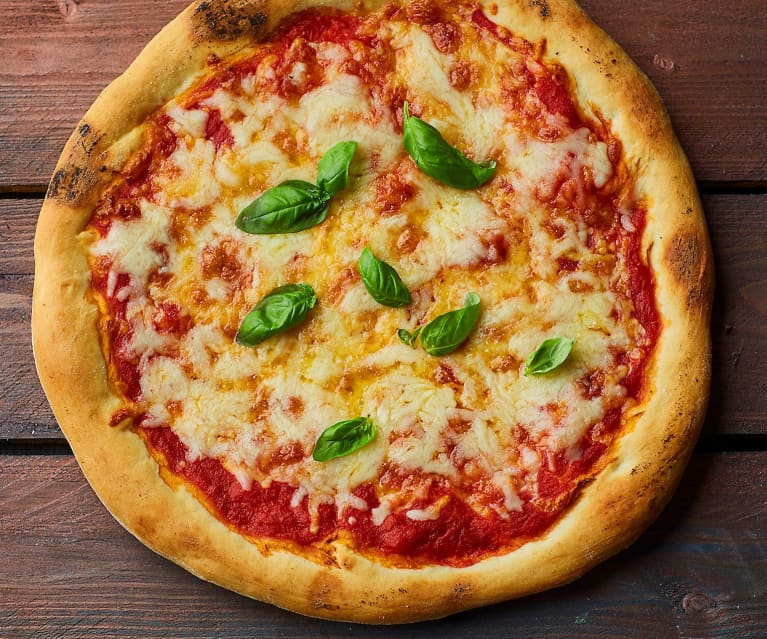

In [ ]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/pizza_marghetita_test.jpg"
text_image_target = ""
number_retrieval = 3
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  34
name_image_found:  pizza_marinara_1.jpg
-----------------------
Extracted:  2
idx:  33
name_image_found:  pizza_margherita_1.jpg
-----------------------
Extracted:  3
idx:  19
name_image_found:  pizza_marinara_2.jpg
-----------------------


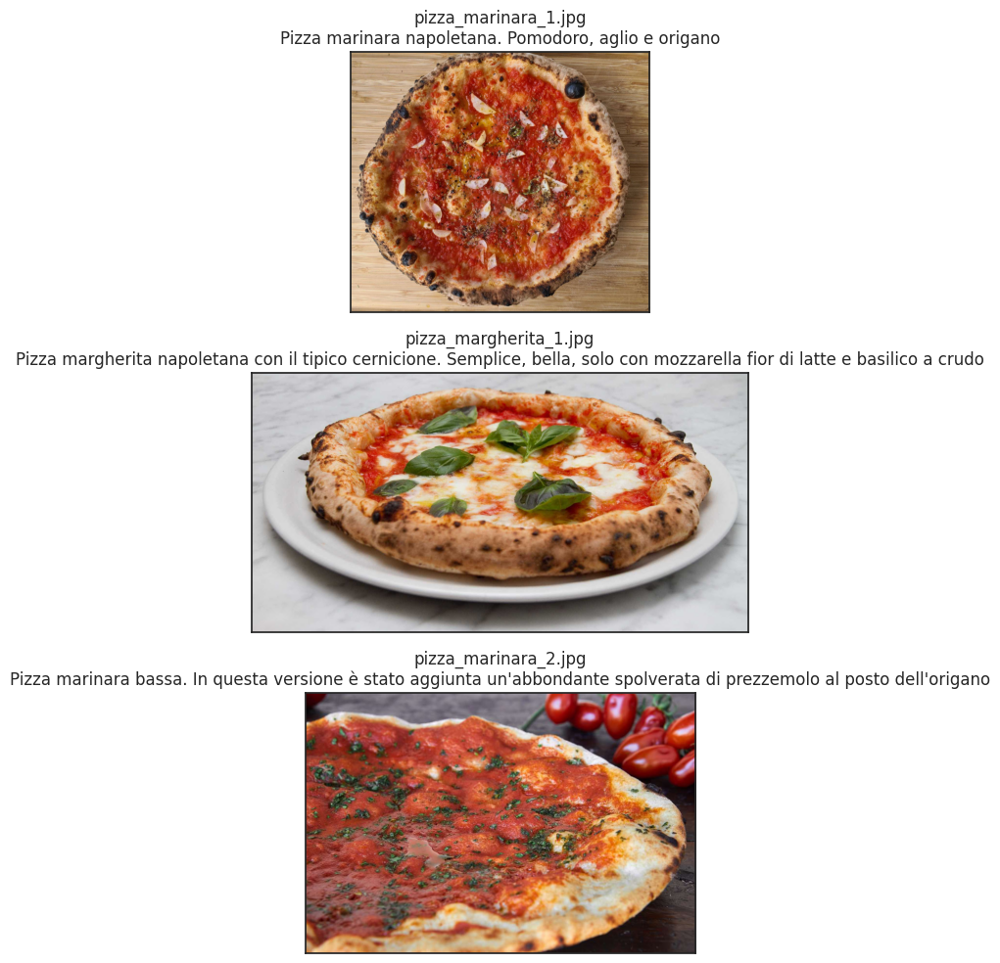

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 2

In [ ]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/bistecca_fiorentina_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Output hidden; open in https://colab.research.google.com to view.

Extracted:  1
idx:  5
name_image_found:  bistecca_fiorentina_3.jpg
-----------------------
Extracted:  2
idx:  17
name_image_found:  bistecca_fiorentina_2.jpg
-----------------------
Extracted:  3
idx:  7
name_image_found:  bistecca_fiorentina_1.jpg
-----------------------
Extracted:  4
idx:  12
name_image_found:  filetto_manzo_1.jpg
-----------------------
Extracted:  5
idx:  18
name_image_found:  filetto_manzo_2.jpeg
-----------------------


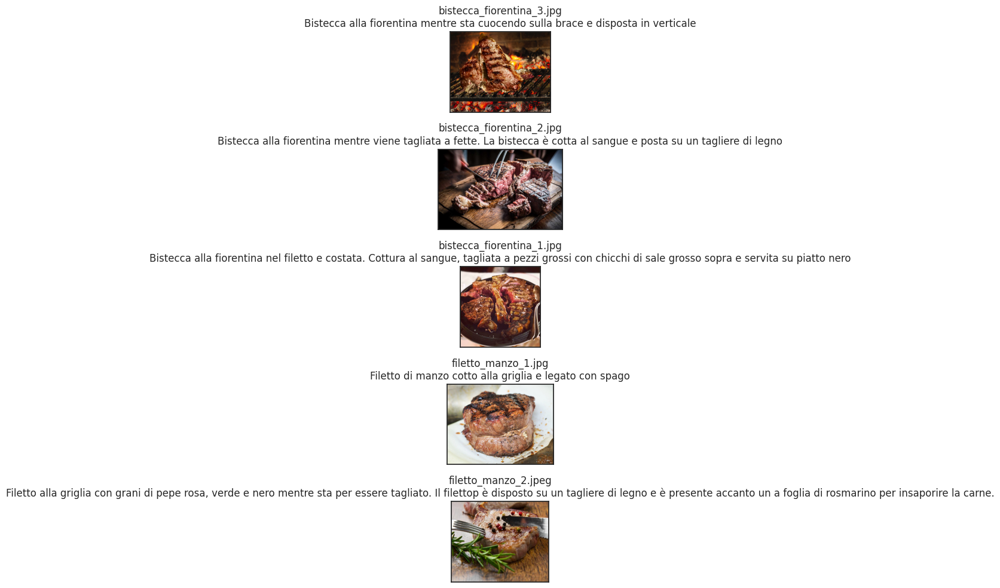

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 3


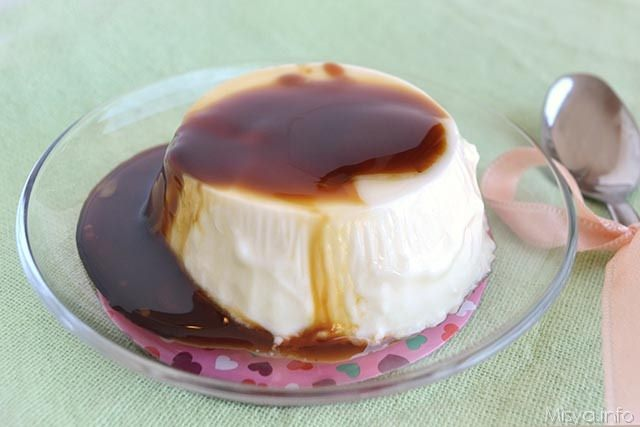

In [ ]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/panna_cotta_caramello_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  42
name_image_found:  panna_cotta_2.jpg
-----------------------
Extracted:  2
idx:  52
name_image_found:  panna_cotta_3.jpg
-----------------------
Extracted:  3
idx:  50
name_image_found:  bigne_2.jpg
-----------------------
Extracted:  4
idx:  43
name_image_found:  bigne_1.jpg
-----------------------
Extracted:  5
idx:  38
name_image_found:  baba_3.jpg
-----------------------


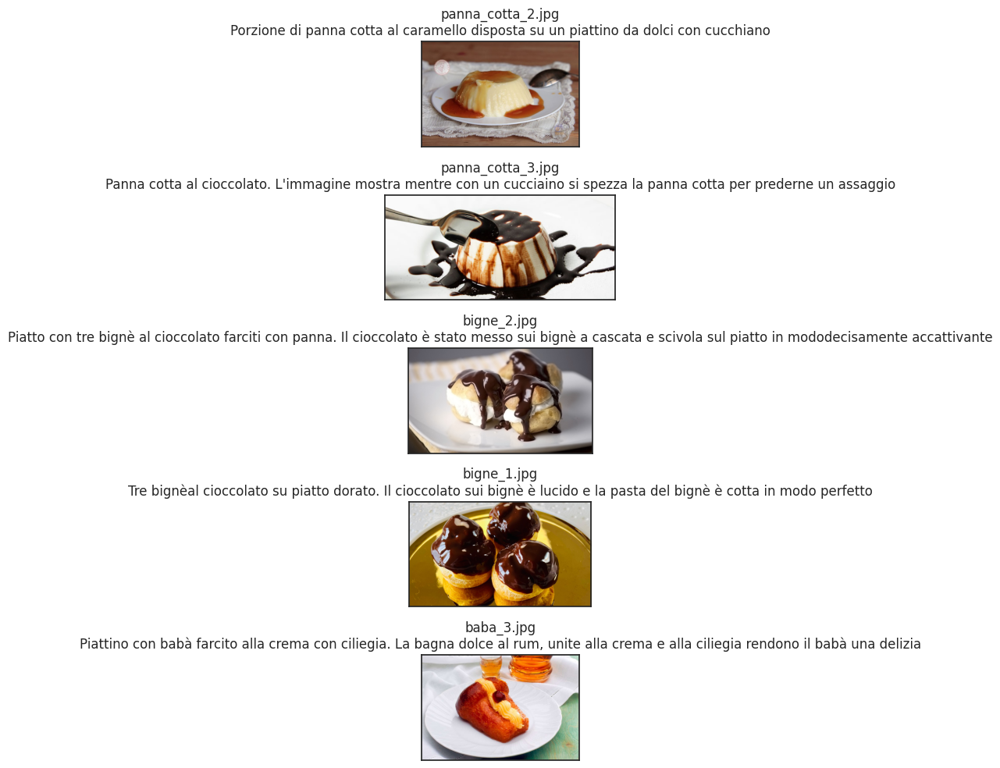

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 4

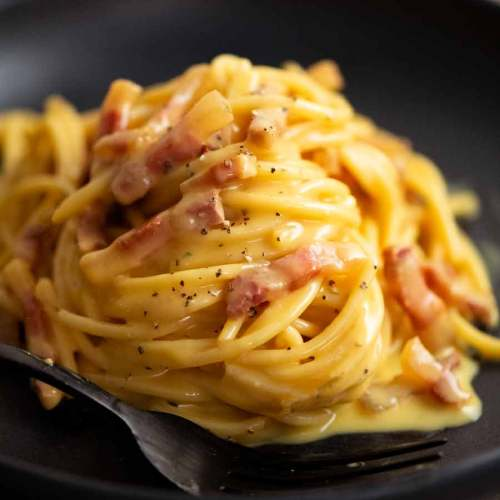

In [ ]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/pasta_carbonara_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  56
name_image_found:  carbonara_2.jpg
-----------------------
Extracted:  2
idx:  62
name_image_found:  pappardelle_cinghiale.jpeg
-----------------------
Extracted:  3
idx:  58
name_image_found:  pasta_amatriciana_2.jpg
-----------------------
Extracted:  4
idx:  61
name_image_found:  pasta_amatriciana_3.jpg
-----------------------
Extracted:  5
idx:  55
name_image_found:  carbonara_1.jpg
-----------------------


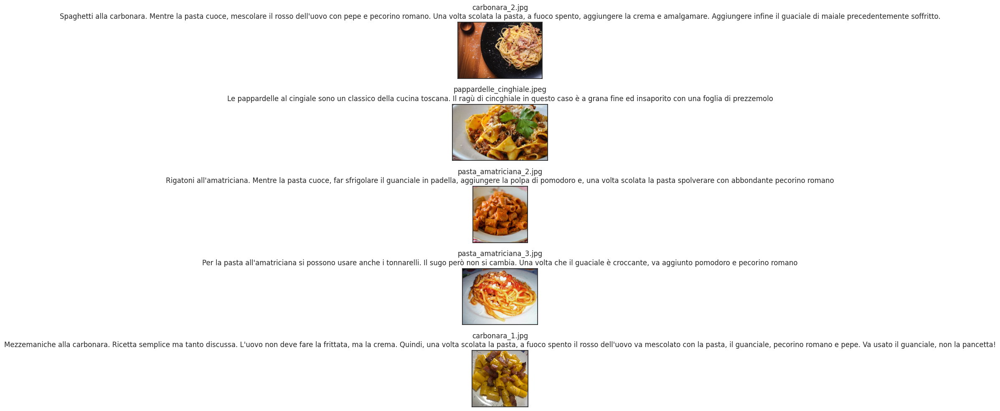

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 5

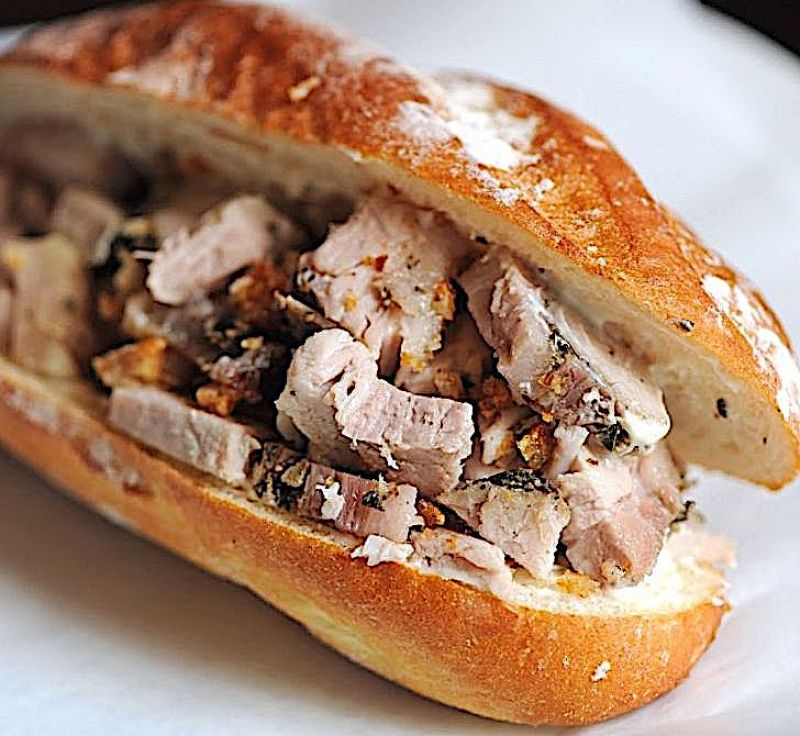

In [ ]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/panino_porchetta_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  4
name_image_found:  porchetta_3.jpg
-----------------------
Extracted:  2
idx:  20
name_image_found:  calzone_2.jpg
-----------------------
Extracted:  3
idx:  2
name_image_found:  porchetta_1.jpg
-----------------------
Extracted:  4
idx:  0
name_image_found:  porchetta_2.jpg
-----------------------
Extracted:  5
idx:  27
name_image_found:  pizza_quattro_formaggi_2.jpg
-----------------------


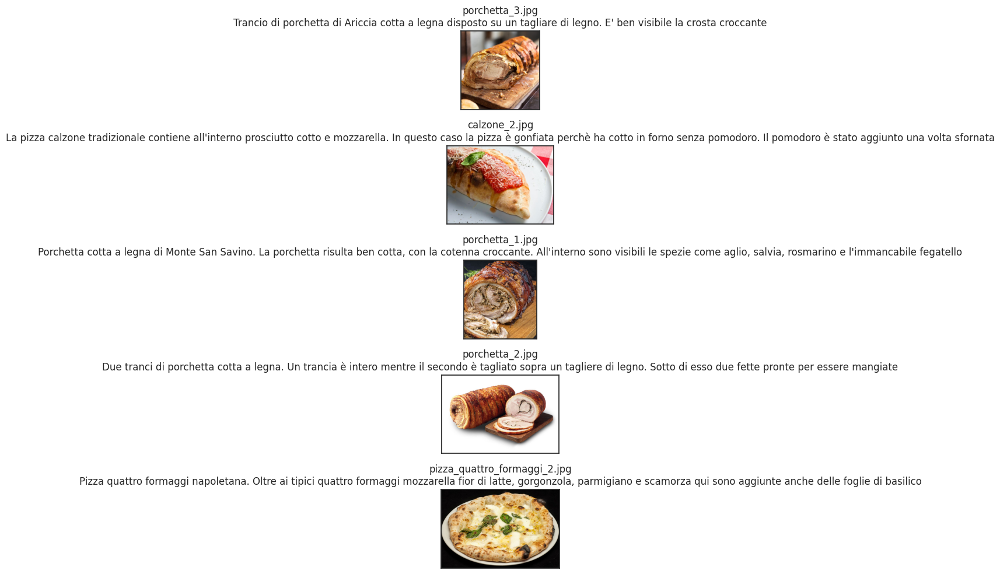

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 6

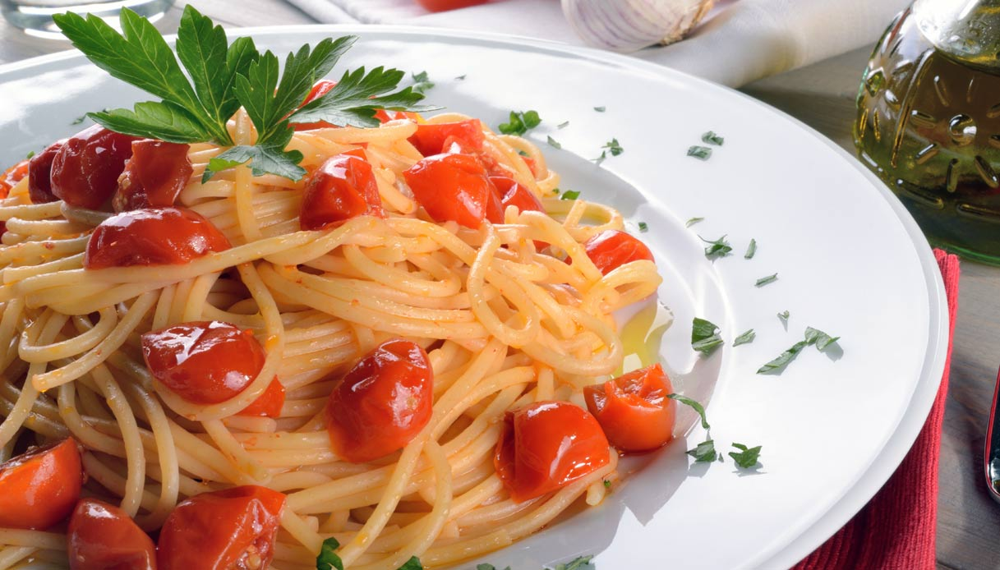

In [ ]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/pasta_pomodorini_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  61
name_image_found:  pasta_amatriciana_3.jpg
-----------------------
Extracted:  2
idx:  60
name_image_found:  pasta_pomodoro.jpg
-----------------------
Extracted:  3
idx:  67
name_image_found:  pasta_pomodoro_3.jpg
-----------------------
Extracted:  4
idx:  68
name_image_found:  pasta_pomodoro_2.jpg
-----------------------
Extracted:  5
idx:  56
name_image_found:  carbonara_2.jpg
-----------------------


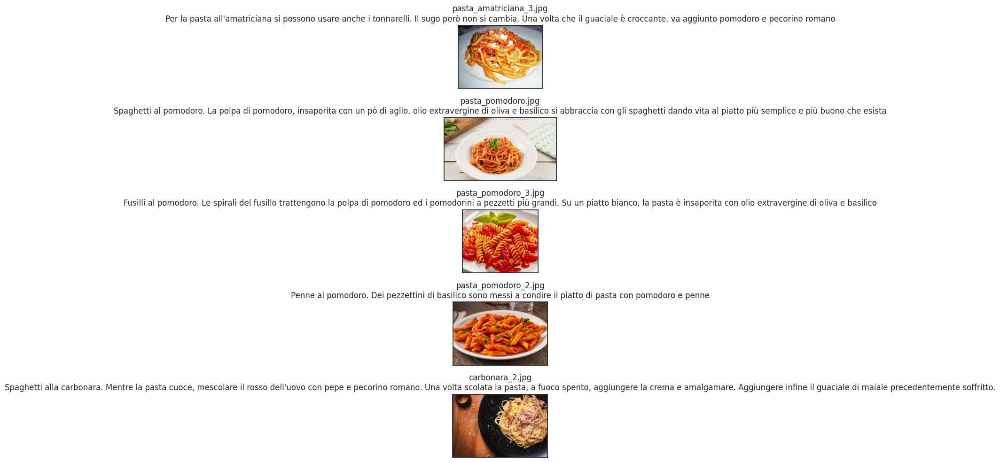

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 7

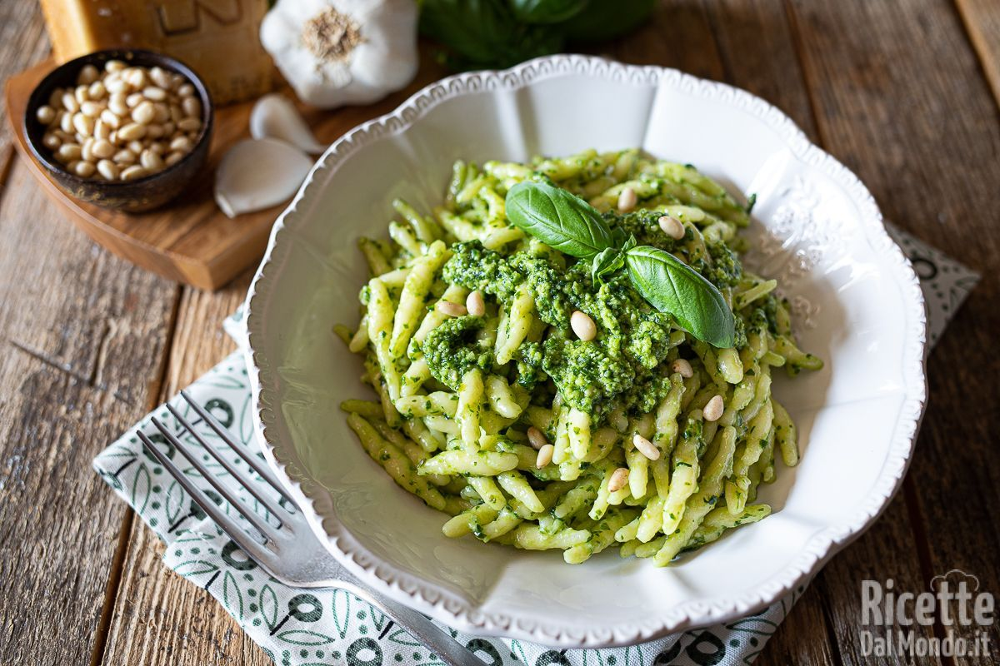

In [ ]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/trofie_pesto_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  66
name_image_found:  pasta_pesto_1.jpg
-----------------------
Extracted:  2
idx:  68
name_image_found:  pasta_pomodoro_2.jpg
-----------------------
Extracted:  3
idx:  58
name_image_found:  pasta_amatriciana_2.jpg
-----------------------
Extracted:  4
idx:  63
name_image_found:  pasta_pesto_2.jpg
-----------------------
Extracted:  5
idx:  60
name_image_found:  pasta_pomodoro.jpg
-----------------------


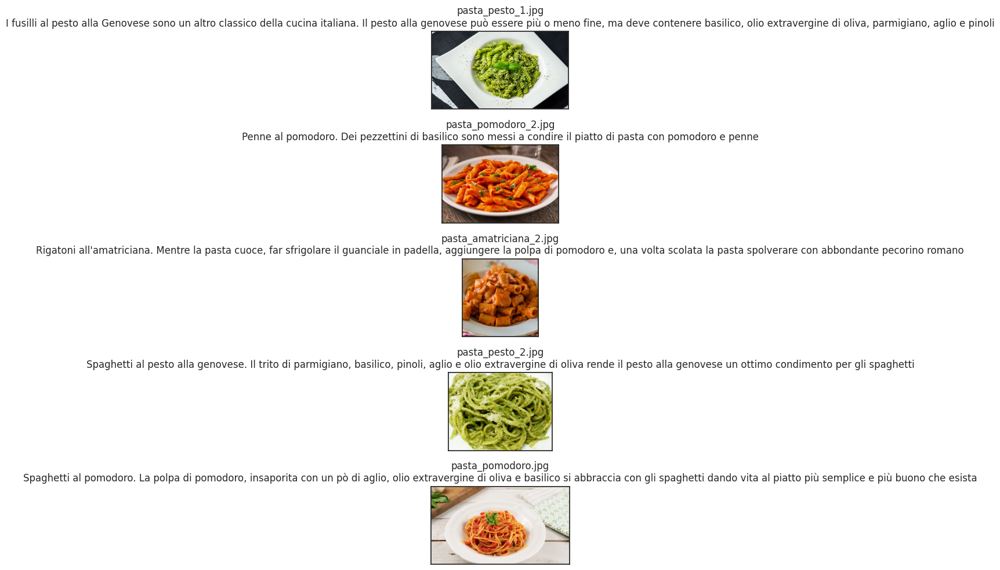

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 8

In [ ]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/vitello_tonnato_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Output hidden; open in https://colab.research.google.com to view.

Extracted:  1
idx:  16
name_image_found:  vitello_tonnato_2.jpg
-----------------------
Extracted:  2
idx:  11
name_image_found:  vitello_tonnato_1.jpg
-----------------------
Extracted:  3
idx:  13
name_image_found:  pollo_arrosto_2.jpg
-----------------------
Extracted:  4
idx:  14
name_image_found:  petto_pollo_pizzaiola_2.jpg
-----------------------
Extracted:  5
idx:  54
name_image_found:  pappardelle_cinghiale_2.jpg
-----------------------


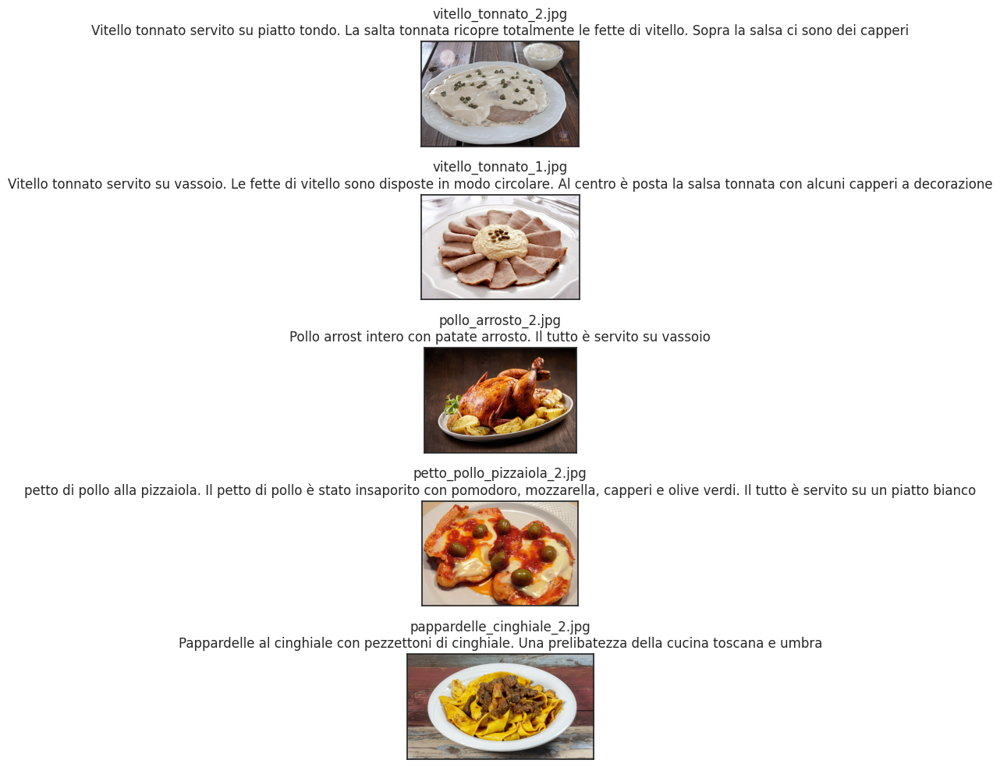

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 9

In [ ]:
#path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/BLIP/test_loreal/curl_expression_test.jpg"
text_image_target = "Pizza quattro stagioni con olive, funghi e prosciutto cotto"
number_retrieval = 5
#raw_image = Image.open(path_image_target).convert("RGB")
#display(raw_image)

Extracted:  1
idx:  39
name_image_found:  baba_1.jpeg
-----------------------
Extracted:  2
idx:  37
name_image_found:  panna_cotta_1.jpeg
-----------------------
Extracted:  3
idx:  67
name_image_found:  pasta_pomodoro_3.jpg
-----------------------
Extracted:  4
idx:  26
name_image_found:  calzone.jpg
-----------------------
Extracted:  5
idx:  41
name_image_found:  baba_2.jpg
-----------------------


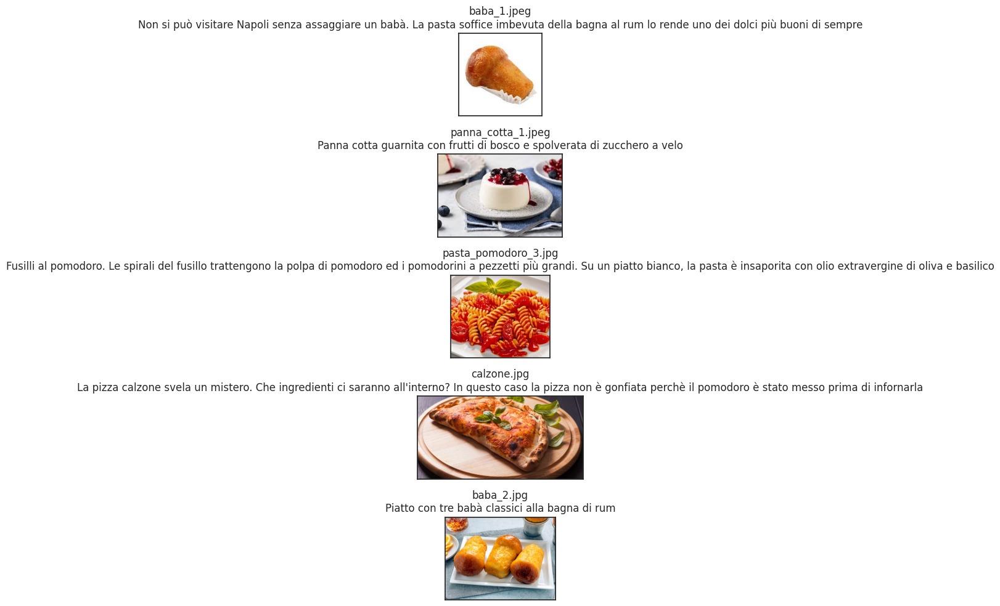

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TI")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  25
name_image_found:  pizza_quattro_stagioni_3.jpg
-----------------------
Extracted:  2
idx:  30
name_image_found:  pizza_margherita_3.jpg
-----------------------
Extracted:  3
idx:  21
name_image_found:  pizza_quattro_stagioni.jpg
-----------------------
Extracted:  4
idx:  55
name_image_found:  carbonara_1.jpg
-----------------------
Extracted:  5
idx:  12
name_image_found:  filetto_manzo_1.jpg
-----------------------


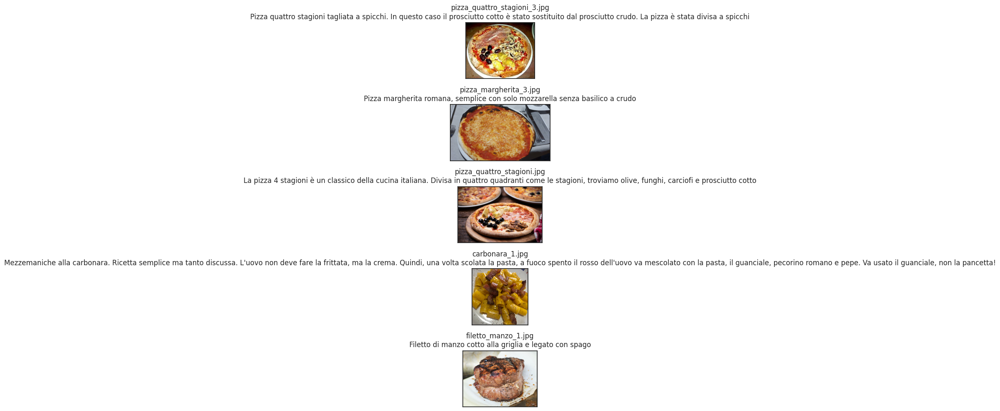

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="MM")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  32
name_image_found:  pizza_quattro_stagioni_2.jpg
-----------------------
Extracted:  2
idx:  21
name_image_found:  pizza_quattro_stagioni.jpg
-----------------------
Extracted:  3
idx:  24
name_image_found:  pizza_capricciosa_2.jpg
-----------------------
Extracted:  4
idx:  22
name_image_found:  pizza_capricciosa_1.jpg
-----------------------
Extracted:  5
idx:  25
name_image_found:  pizza_quattro_stagioni_3.jpg
-----------------------


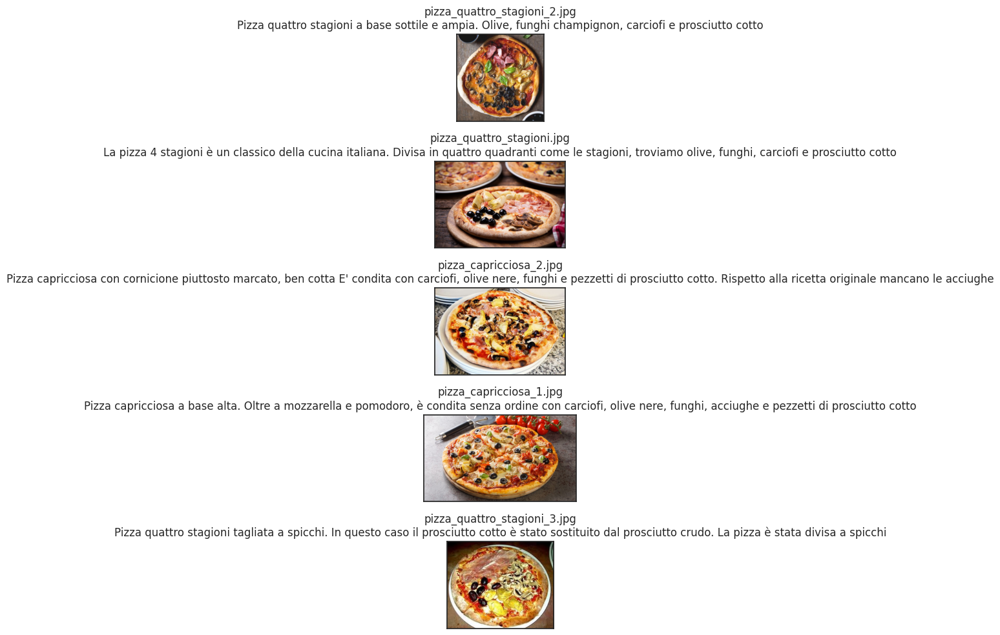

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TT")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 10

In [ ]:
#path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/BLIP/test_loreal/curl_expression_test.jpg"
text_image_target = "PAppardelle al sugo di cinghiale senza pomodoro"
number_retrieval = 5
#raw_image = Image.open(path_image_target).convert("RGB")
#display(raw_image)

Extracted:  1
idx:  39
name_image_found:  baba_1.jpeg
-----------------------
Extracted:  2
idx:  4
name_image_found:  porchetta_3.jpg
-----------------------
Extracted:  3
idx:  0
name_image_found:  porchetta_2.jpg
-----------------------
Extracted:  4
idx:  43
name_image_found:  bigne_1.jpg
-----------------------
Extracted:  5
idx:  50
name_image_found:  bigne_2.jpg
-----------------------


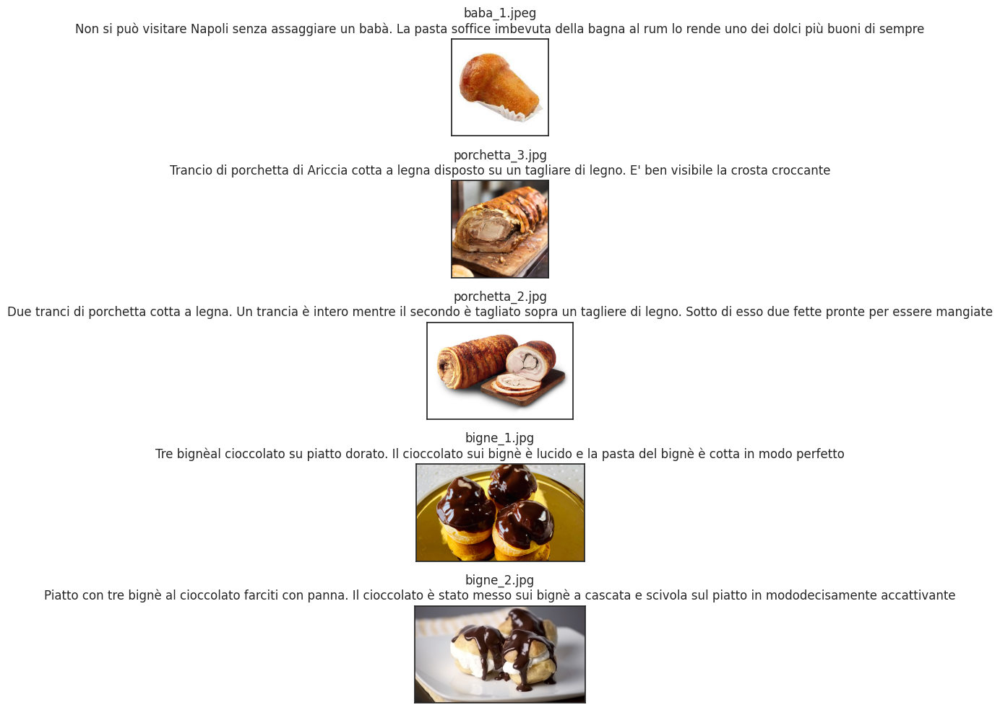

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TI")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  30
name_image_found:  pizza_margherita_3.jpg
-----------------------
Extracted:  2
idx:  25
name_image_found:  pizza_quattro_stagioni_3.jpg
-----------------------
Extracted:  3
idx:  57
name_image_found:  pasta_norma_2.jpg
-----------------------
Extracted:  4
idx:  55
name_image_found:  carbonara_1.jpg
-----------------------
Extracted:  5
idx:  39
name_image_found:  baba_1.jpeg
-----------------------


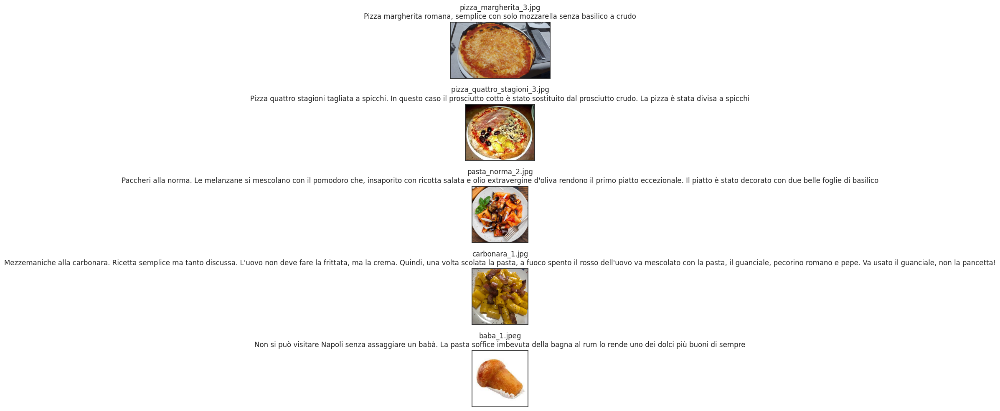

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="MM")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  62
name_image_found:  pappardelle_cinghiale.jpeg
-----------------------
Extracted:  2
idx:  54
name_image_found:  pappardelle_cinghiale_2.jpg
-----------------------
Extracted:  3
idx:  59
name_image_found:  pasta_amatriciana_1.jpg
-----------------------
Extracted:  4
idx:  58
name_image_found:  pasta_amatriciana_2.jpg
-----------------------
Extracted:  5
idx:  61
name_image_found:  pasta_amatriciana_3.jpg
-----------------------


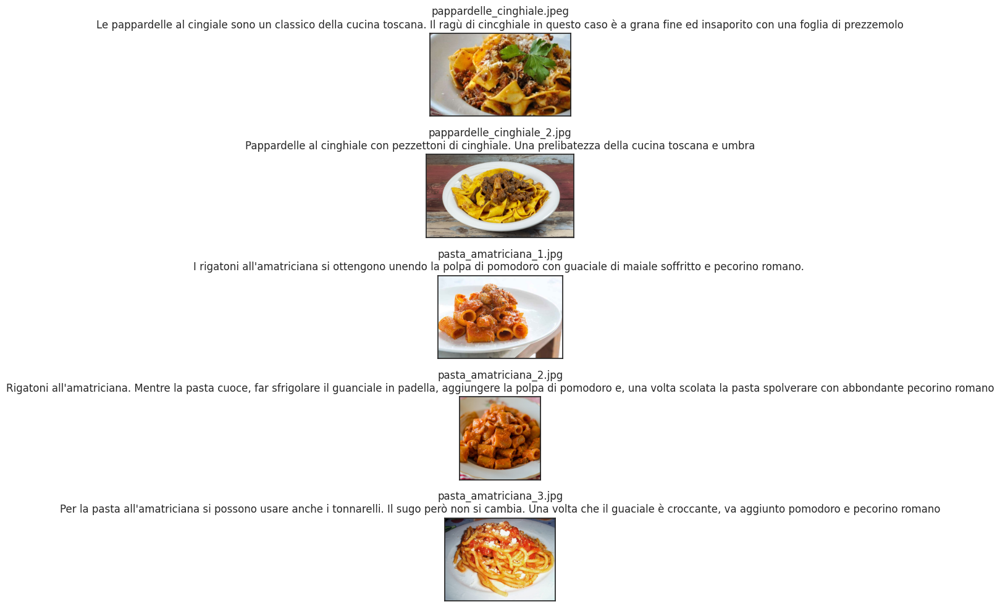

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TT")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()